In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os

import mne
import mne_bids

from collections import defaultdict
from scipy import stats as scipy_stats
from scipy.stats import pearsonr
import statsmodels.api as sm


In [2]:
import pandas as pd
import os

bids_dir = '../../../'

subjects = [
    "05", "07", "10", "14", "19", "20", "26", "34", "46", "40"
]

def load_electrode_coords(subject_id):
    electrodes_path = (
        f"{bids_dir}/sub-{subject_id}/ses-iemu/ieeg/"
        f"sub-{subject_id}_ses-iemu_acq-clinical_electrodes.tsv"
    )

    if not os.path.exists(electrodes_path):
        print(f"Subject {subject_id}: No electrode file found")
        return None

    try:
        df = pd.read_csv(electrodes_path, sep='\t')
        print(f"Subject {subject_id}: Found {len(df)} electrodes")
        return df
    except Exception as e:
        print(f"Error loading subject {subject_id}: {e}")
        return None


for subject in subjects[:3]:
    coords = load_electrode_coords(subject)
    if coords is None:
        continue

    print("\nColumns:", coords.columns.tolist())
    print("\nFirst few rows:")
    print(coords.head())
    print("\nCoordinate ranges:")
    print(f"x: {coords['x'].min():.1f} to {coords['x'].max():.1f}")
    print(f"y: {coords['y'].min():.1f} to {coords['y'].max():.1f}")
    print(f"z: {coords['z'].min():.1f} to {coords['z'].max():.1f}")
    print("-" * 50)

Subject 05: Found 80 electrodes

Columns: ['name', 'x', 'y', 'z', 'size', 'group', 'hemisphere']

First few rows:
  name       x       y      z  size group hemisphere
0  T01 -45.259 -51.007  5.166   NaN     T          L
1  T02 -46.259 -42.007  4.166   NaN     T          L
2  T03 -44.259 -30.007  4.166   NaN     T          L
3  T04 -30.259 -21.007  1.166   NaN     T          L
4  T05 -44.259 -13.007  2.166   NaN     T          L

Coordinate ranges:
x: -62.3 to -24.3
y: -54.0 to 46.0
z: -10.8 to 73.2
--------------------------------------------------
Subject 07: Found 56 electrodes

Columns: ['name', 'x', 'y', 'z', 'size']

First few rows:
  name      x       y       z  size
0  FB1 -41.13  -9.159 -19.464   NaN
1  FB2 -47.13  -2.159 -18.464   NaN
2  FB3 -52.13   5.841 -14.464   NaN
3  FB4 -53.13  12.841  -8.464   NaN
4  FB5 -53.13  18.841  -0.464   NaN

Coordinate ranges:
x: -53.1 to 7.9
y: -9.2 to 79.8
z: -19.5 to 76.5
--------------------------------------------------
Subject 10: Found 

In [3]:
electrode_data = {}

for subject in subjects:
    df = load_electrode_coords(subject)
    if df is not None:
        electrode_data[subject] = df

Subject 05: Found 80 electrodes
Subject 07: Found 56 electrodes
Subject 10: Found 96 electrodes
Subject 14: Found 112 electrodes
Subject 19: Found 80 electrodes
Subject 20: Found 96 electrodes
Subject 26: Found 88 electrodes
Subject 34: Found 104 electrodes
Subject 46: Found 64 electrodes
Subject 40: Found 72 electrodes


In [4]:
from collections import defaultdict

def classify_electrode_by_coordinates(x, y, z):
    if (-60 < x < -40) and (-40 < y < 0) and (0 < z < 20):
        return "STG"
    elif (-50 < x < -30) and (20 < y < 50) and (0 < z < 30):
        return "IFG"
    elif (y > 30) and (z > 20):
        return "Frontal"
    elif (y < 0) and (-20 < z < 20):
        return "Temporal"
    elif (-30 < y < 30) and (z > 30):
        return "Parietal"
    elif (y < -30):
        return "Occipital"
    else:
        return "Other"


region_distribution = defaultdict(lambda: defaultdict(int))

for subject, df in electrode_data.items():
    for _, row in df.iterrows():
        region = classify_electrode_by_coordinates(row['x'], row['y'], row['z'])
        region_distribution[subject][region] += 1


print("Electrode Distribution by Brain Region:")
print("-" * 60)
for subject in sorted(region_distribution):
    print(f"Subject {subject}:")
    for region, count in sorted(region_distribution[subject].items()):
        print(f"  {region}: {count} electrodes")
    print()

Electrode Distribution by Brain Region:
------------------------------------------------------------
Subject 05:
  Frontal: 8 electrodes
  IFG: 3 electrodes
  Occipital: 6 electrodes
  Other: 20 electrodes
  Parietal: 30 electrodes
  STG: 7 electrodes
  Temporal: 6 electrodes

Subject 07:
  Frontal: 28 electrodes
  IFG: 3 electrodes
  Other: 15 electrodes
  Parietal: 8 electrodes
  Temporal: 2 electrodes

Subject 10:
  Frontal: 1 electrodes
  IFG: 12 electrodes
  Other: 72 electrodes
  Parietal: 4 electrodes
  Temporal: 7 electrodes

Subject 14:
  Frontal: 27 electrodes
  IFG: 3 electrodes
  Occipital: 9 electrodes
  Other: 7 electrodes
  Parietal: 66 electrodes

Subject 19:
  Frontal: 14 electrodes
  IFG: 3 electrodes
  Occipital: 1 electrodes
  Other: 41 electrodes
  Parietal: 10 electrodes
  Temporal: 11 electrodes

Subject 20:
  IFG: 3 electrodes
  Occipital: 11 electrodes
  Other: 31 electrodes
  Parietal: 11 electrodes
  STG: 7 electrodes
  Temporal: 33 electrodes

Subject 26:
  

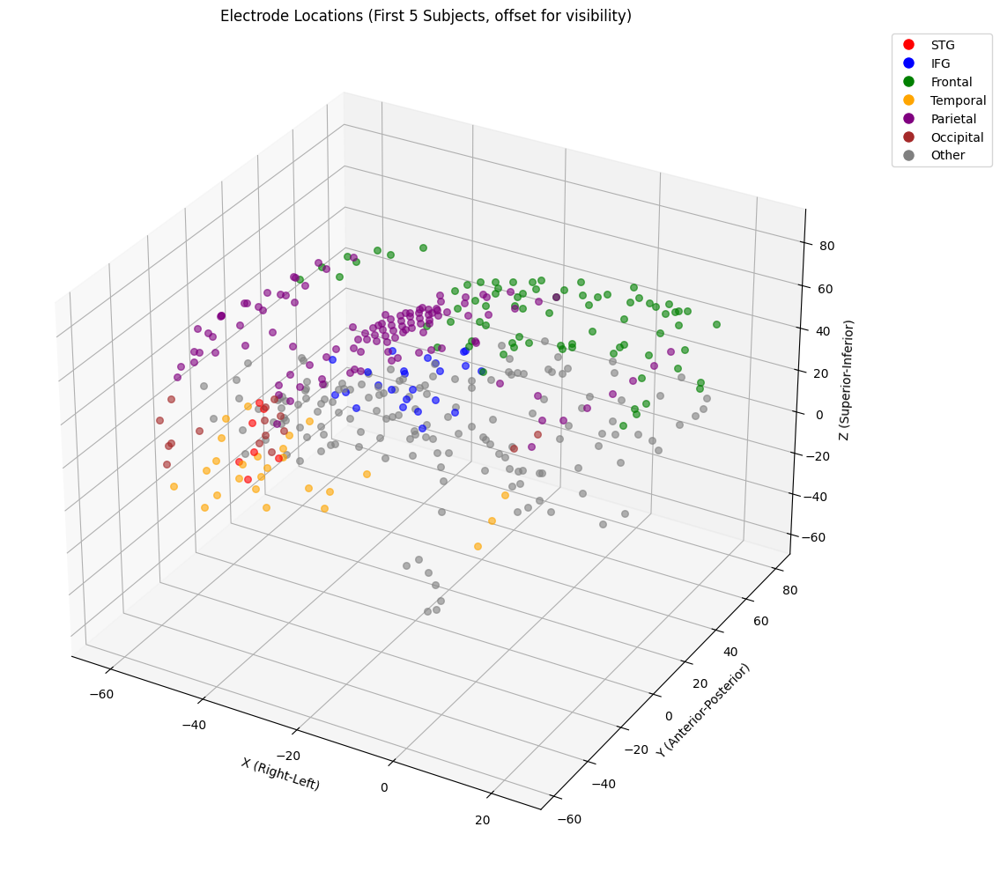

In [5]:
fig = plt.figure(figsize=(15, 10))
ax = fig.add_subplot(111, projection='3d')

region_colors = {
    'STG': 'red',
    'IFG': 'blue',
    'Frontal': 'green',
    'Temporal': 'orange',
    'Parietal': 'purple',
    'Occipital': 'brown',
    'Other': 'gray'
}

for i, (subject, df) in enumerate(list(electrode_data.items())[:5]):
    offset = i * 5
    for j, row in enumerate(df.iterrows()):
        row = row[1]
        region = classify_electrode_by_coordinates(row['x'], row['y'], row['z'])
        color = region_colors.get(region, 'gray')

        ax.scatter(
            row['x'] + offset,
            row['y'],
            row['z'],
            color=color,
            alpha=0.6,
            s=30,
            label=region if j == 0 else ""
        )

ax.set_xlabel('X (Right-Left)')
ax.set_ylabel('Y (Anterior-Posterior)')
ax.set_zlabel('Z (Superior-Inferior)')
ax.set_title('Electrode Locations (First 5 Subjects, offset for visibility)')

handles = [
    plt.Line2D([0], [0], marker='o', color='w',
               markerfacecolor=color, markersize=10, label=region)
    for region, color in region_colors.items()
]

ax.legend(handles=handles, bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

In [6]:
print("Filtering subjects with STG/IFG coverage...")
print("-" * 60)

stg_ifg_subjects_data = []

for subject in subjects:
    if subject not in region_distribution:
        continue

    stg_count = region_distribution[subject].get('STG', 0)
    ifg_count = region_distribution[subject].get('IFG', 0)
    total_roi = stg_count + ifg_count

    if total_roi >= 3:
        stg_ifg_subjects_data.append(subject)
        print(f"Subject {subject}: {total_roi} ROI electrodes (STG: {stg_count}, IFG: {ifg_count})")


selected_subjects = sorted(stg_ifg_subjects_data)

print("\n" + "=" * 60)
print(f"FINAL COHORT FOR ANALYSIS (N={len(selected_subjects)})")
print("=" * 60)
print(f"Subjects: {', '.join(selected_subjects)}")

Filtering subjects with STG/IFG coverage...
------------------------------------------------------------
Subject 05: 10 ROI electrodes (STG: 7, IFG: 3)
Subject 07: 3 ROI electrodes (STG: 0, IFG: 3)
Subject 10: 12 ROI electrodes (STG: 0, IFG: 12)
Subject 14: 3 ROI electrodes (STG: 0, IFG: 3)
Subject 19: 3 ROI electrodes (STG: 0, IFG: 3)
Subject 20: 10 ROI electrodes (STG: 7, IFG: 3)
Subject 26: 5 ROI electrodes (STG: 5, IFG: 0)
Subject 34: 11 ROI electrodes (STG: 9, IFG: 2)
Subject 46: 12 ROI electrodes (STG: 9, IFG: 3)
Subject 40: 6 ROI electrodes (STG: 5, IFG: 1)

FINAL COHORT FOR ANALYSIS (N=10)
Subjects: 05, 07, 10, 14, 19, 20, 26, 34, 40, 46


In [7]:
def get_electrodes_by_region(subject_id, target_regions=['STG', 'IFG']):
    if subject_id not in electrode_data:
        return []

    df = electrode_data[subject_id]
    region_electrodes = []

    for _, row in df.iterrows():
        region = classify_electrode_by_coordinates(row['x'], row['y'], row['z'])
        if region in target_regions:
            region_electrodes.append(row['name'])

    return region_electrodes

In [8]:
import mne
import mne_bids
import numpy as np

def preprocess_subject_region(subject_id, region_electrodes, task='film'):
    print(f"\n=== Preprocessing Subject {subject_id}, Task: {task} ===")

    session = 'iemu'
    acquisition = 'clinical'
    run = '1'
    datatype = 'ieeg'

    channels_path = mne_bids.BIDSPath(
        subject=subject_id,
        session=session,
        suffix='channels',
        extension='tsv',
        datatype=datatype,
        task=task,
        acquisition=acquisition,
        run=run,
        root=bids_dir
    )

    channels_files = list(channels_path.match())
    if not channels_files:
        print(f"Warning: No channels file found for subject {subject_id}, task {task}")
        return None

    channels = pd.read_csv(str(channels_files[0]), sep='\t')

    data_path = mne_bids.BIDSPath(
        subject=subject_id,
        session=session,
        suffix='ieeg',
        extension='vhdr',
        datatype=datatype,
        task=task,
        acquisition=acquisition,
        run=run,
        root=bids_dir
    )

    data_files = list(data_path.match())
    if not data_files:
        print(f"Warning: No data file found for subject {subject_id}, task {task}")
        return None

    raw = mne.io.read_raw_brainvision(str(data_files[0]), preload=False, verbose=False)

    raw.set_channel_types({
        ch: str(typ).lower() if str(typ).lower() in ['ecog', 'seeg', 'eeg'] else 'misc'
        for ch, typ in zip(raw.ch_names, channels['type'].values)
    })

    raw.drop_channels([ch for ch, t in zip(raw.ch_names, raw.get_channel_types()) if t == 'misc'])

    if 'status' in channels.columns:
        bads = channels.loc[
            (channels['type'].isin(['ECOG', 'SEEG'])) &
            (channels['status'] == 'bad'),
            'name'
        ].tolist()
        raw.info['bads'].extend([ch for ch in bads if ch in raw.ch_names])

    region_electrodes = [
        ch for ch in region_electrodes
        if ch in raw.ch_names and ch not in raw.info['bads']
    ]

    if not region_electrodes:
        print(f"Warning: No region electrodes found in data for subject {subject_id}")
        return None

    print(f"Processing {len(region_electrodes)} region electrodes")

    raw.load_data()

    if raw.info['sfreq'] != 512:
        raw.resample(512)

    raw.notch_filter(freqs=np.arange(50, 251, 50))

    raw_region = raw.copy()
    raw_region.pick_channels(region_electrodes)

    if len(region_electrodes) > 1:
        raw_region, _ = mne.set_eeg_reference(raw_region, 'average')

    for i, ch in enumerate(region_electrodes):
        idx = raw.ch_names.index(ch)
        raw._data[idx, :] = raw_region._data[i, :]

    print(f"Preprocessing complete for subject {subject_id}")
    return raw, region_electrodes

In [9]:
def load_events_and_create_epochs(subject_id, raw, task='film'):
    print(f"\n=== Creating Epochs for Subject {subject_id} ===")

    events_path = mne_bids.BIDSPath(
        subject=subject_id,
        session='iemu',
        suffix='events',
        extension='tsv',
        datatype='ieeg',
        task=task,
        run='1',
        root=bids_dir
    )

    events_files = list(events_path.match())
    if not events_files:
        print(f"Warning: No events file found for subject {subject_id}, task {task}")
        return None, None

    events_df = pd.read_csv(str(events_files[0]), sep='\t')

    if task == 'film':
        speech_events, music_events = [], []

        for _, row in events_df.iterrows():
            trial_type = str(row.get('trial_type', '')).lower()
            onset = row['onset']
            duration = row.get('duration', 30.0)

            if 'speech' in trial_type:
                speech_events.append((onset, duration))
            elif 'music' in trial_type:
                music_events.append((onset, duration))

        print(f"Found {len(speech_events)} speech blocks, {len(music_events)} music blocks")

        speech_epochs, music_epochs = [], []

        for onset, duration in speech_events:
            start = int(onset * raw.info['sfreq'])
            end = int((onset + duration) * raw.info['sfreq'])
            if end <= raw.n_times:
                speech_epochs.append(raw._data[:, start:end])

        for onset, duration in music_events:
            start = int(onset * raw.info['sfreq'])
            end = int((onset + duration) * raw.info['sfreq'])
            if end <= raw.n_times:
                music_epochs.append(raw._data[:, start:end])

        return speech_epochs, music_epochs

    if task == 'rest':
        return [raw._data], None

In [10]:
def compute_time_frequency_working(
    epochs_data,
    sfreq=512,
    frequencies=np.logspace(np.log10(2), np.log10(100), 20)
):
    if not epochs_data:
        return None

    try:
        info = mne.create_info(
            ch_names=[f'ch{i}' for i in range(epochs_data[0].shape[0])],
            sfreq=sfreq,
            ch_types='ecog'
        )

        epochs_array = mne.EpochsArray(
            data=np.array(epochs_data),
            info=info
        )

        n_cycles = frequencies / 3.0
        n_cycles[n_cycles < 2] = 2

        tfr = epochs_array.compute_tfr(
            method='morlet',
            freqs=frequencies,
            n_cycles=n_cycles,
            return_itc=False,
            average=True
        )

        return tfr.data[0]

    except Exception as e:
        print(f"Error in TFR computation: {e}")
        return compute_time_frequency_simple_fallback(epochs_data, sfreq, frequencies)


def compute_time_frequency_simple_fallback(epochs_data, sfreq, frequencies):
    print("Using fallback TFR method...")

    avg_signal = np.mean(
        [np.mean(epoch, axis=0) for epoch in epochs_data],
        axis=0
    )

    from scipy import signal, interpolate

    nperseg = min(256, len(avg_signal) // 4)
    noverlap = nperseg // 2

    freqs, _, Sxx = signal.spectrogram(
        avg_signal,
        fs=sfreq,
        nperseg=nperseg,
        noverlap=noverlap,
        scaling='density'
    )

    f_interp = interpolate.interp1d(
        freqs, Sxx, axis=0, bounds_error=False, fill_value=0
    )
    Sxx_interp = f_interp(frequencies)

    return 10 * np.log10(Sxx_interp + 1e-10)

In [11]:
def apply_baseline_correction(tfr_task, tfr_baseline, method='percent'):
    if tfr_baseline is None:
        print("Warning: No baseline data provided")
        return tfr_task

    baseline_mean = np.mean(tfr_baseline, axis=1, keepdims=True)
    baseline_std = np.std(tfr_baseline, axis=1, keepdims=True)

    if method == 'percent':
        return (tfr_task - baseline_mean) / baseline_mean * 100
    elif method == 'zscore':
        return (tfr_task - baseline_mean) / baseline_std
    elif method == 'log':
        return np.log10(tfr_task / baseline_mean)
    else:
        print(f"Unknown method {method}, using percent change")
        return (tfr_task - baseline_mean) / baseline_mean * 100

In [12]:
frequencies = np.arange(1, 121, 2)
hfb_mask = (frequencies >= 60) & (frequencies <= 120)

results = {}

for subject in selected_subjects:
    print(f"\n{'='*60}")
    print(f"PROCESSING SUBJECT {subject} (Paper Method)")
    print(f"{'='*60}")

    try:
        region_electrodes = get_electrodes_by_region(subject, ['STG', 'IFG'])
        if not region_electrodes:
            print(f"Skipping Sub-{subject}: No electrodes in ROI.")
            continue

        film_result = preprocess_subject_region(subject, region_electrodes, task='film')
        if film_result is None:
            continue

        raw_film, region_electrodes_clean = film_result

        rest_result = preprocess_subject_region(subject, region_electrodes_clean, task='rest')
        raw_rest, _ = rest_result if rest_result else (None, None)

        region_indices = [
            raw_film.ch_names.index(ch)
            for ch in region_electrodes_clean
            if ch in raw_film.ch_names
        ]

        chan_intensities = [
            np.mean(np.abs(raw_film._data[ch_idx, :]))
            for ch_idx in region_indices
        ]

        num_to_pick = min(5, len(chan_intensities))
        top_indices = np.argsort(chan_intensities)[-num_to_pick:]
        best_chan_indices = [region_indices[i] for i in top_indices]

        speech_epochs, music_epochs, rest_epochs = [], [], []

        events_path = mne_bids.BIDSPath(
            subject=subject,
            session='iemu',
            suffix='events',
            extension='tsv',
            datatype='ieeg',
            task='film',
            root=bids_dir
        )
        events_df = pd.read_csv(str(events_path.match()[0]), sep='\t')

        for _, row in events_df.iterrows():
            trial_type = str(row.get('trial_type', '')).lower()
            start = int(row['onset'] * 512)
            end = int((row['onset'] + 30.0) * 512)

            if end <= raw_film.n_times:
                epoch = raw_film._data[best_chan_indices, start:end]
                if 'speech' in trial_type:
                    speech_epochs.append(epoch)
                elif 'music' in trial_type:
                    music_epochs.append(epoch)

        if raw_rest:
            block_len = 30 * 512
            for i in range(int(raw_rest.n_times / block_len)):
                start = i * block_len
                end = (i + 1) * block_len
                rest_epochs.append(raw_rest._data[best_chan_indices, start:end])

        tfr_speech = compute_time_frequency_working(speech_epochs, 512, frequencies)
        tfr_music = compute_time_frequency_working(music_epochs, 512, frequencies)
        tfr_rest = (
            compute_time_frequency_working(rest_epochs, 512, frequencies)
            if rest_epochs else None
        )

        tfr_s_corr = (
            apply_baseline_correction(tfr_speech, tfr_rest)
            if tfr_rest is not None else tfr_speech
        )
        tfr_m_corr = (
            apply_baseline_correction(tfr_music, tfr_rest)
            if tfr_rest is not None else tfr_music
        )

        s_env = tfr_s_corr[hfb_mask, :].mean(axis=0)
        m_env = tfr_m_corr[hfb_mask, :].mean(axis=0)

        y = np.concatenate([m_env, s_env])
        predictor = np.concatenate([
            np.zeros(len(m_env)),
            np.ones(len(s_env))
        ])

        best_t, p_val = -np.inf, 1.0
        for lag in range(0, 512, 50):
            shifted_x = sm.add_constant(np.roll(predictor, lag))
            model = sm.OLS(y, shifted_x).fit()
            if model.tvalues[1] > best_t:
                best_t = model.tvalues[1]
                p_val = model.pvalues[1]

        r, _ = pearsonr(y, predictor)

        results[subject] = {
            'tfr_speech': tfr_s_corr,
            'tfr_music': tfr_m_corr,
            'frequencies': frequencies,
            't_stat': best_t,
            'p_val': p_val,
            'signed_r2': np.sign(r) * (r ** 2)
        }

        print(f"Sub-{subject} Complete: T={best_t:.2f}, p={p_val:.4e}")

    except Exception as e:
        print(f"Error processing subject {subject}: {e}")

print(f"\nANALYSIS COMPLETE! Processed {len(results)} subjects.")


PROCESSING SUBJECT 05 (Paper Method)

=== Preprocessing Subject 05, Task: film ===
Processing 9 region electrodes
Reading 0 ... 1083321  =      0.000 ...   528.965 secs...


C:\Users\USER\AppData\Local\Temp\ipykernel_1740\3216670011.py:51: RuntimeWarning: The unit for channel(s) AH+, ECG+, EMG2, MKR1+, MKR2+, abdo+, emg1+, orb+, thor+, xxx1, xxx2, xxx3, xxx4, xxx5, xxx6, xxx7, xxx8 has changed from V to NA.
  raw.set_channel_types({


Filtering raw data in 1 contiguous segment
Setting up band-stop filter

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower transition bandwidth: 0.50 Hz
- Upper transition bandwidth: 0.50 Hz
- Filter length: 3381 samples (6.604 s)

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
ECoG channel type selected for re-referencing
Applying average reference.
Applying a custom ('ECoG',) reference.
Preprocessing complete for subject 05

=== Preprocessing Subject 05, Task: rest ===
Processing 9 region electrodes
Reading 0 ... 400678  =      0.000 ...   195.644 secs...


C:\Users\USER\AppData\Local\Temp\ipykernel_1740\3216670011.py:51: RuntimeWarning: The unit for channel(s) AH+, ECG+, EMG2, MKR1+, MKR2+, abdo+, emg1+, thor+ has changed from V to NA.
  raw.set_channel_types({


Filtering raw data in 1 contiguous segment
Setting up band-stop filter

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower transition bandwidth: 0.50 Hz
- Upper transition bandwidth: 0.50 Hz
- Filter length: 3381 samples (6.604 s)

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
ECoG channel type selected for re-referencing
Applying average reference.
Applying a custom ('ECoG',) reference.
Preprocessing complete for subject 05
Not setting metadata
6 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
7 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
6 matching events found
No baseline correction applied
0 projection items activated
Sub-05 Complete: T=5.72, p=1.0692e-08

C:\Users\USER\AppData\Local\Temp\ipykernel_1740\3216670011.py:51: RuntimeWarning: The unit for channel(s) ECG+, EMG4+, MKR+, abdo+, orb+, thor+ has changed from V to NA.
  raw.set_channel_types({


Filtering raw data in 1 contiguous segment
Setting up band-stop filter

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower transition bandwidth: 0.50 Hz
- Upper transition bandwidth: 0.50 Hz
- Filter length: 3381 samples (6.604 s)

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
ECoG channel type selected for re-referencing
Applying average reference.
Applying a custom ('ECoG',) reference.
Preprocessing complete for subject 07

=== Preprocessing Subject 07, Task: rest ===
Processing 3 region electrodes
Reading 0 ... 100291  =      0.000 ...   195.881 secs...
Filtering raw data in 1 contiguous segment
Setting up band-stop filter

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) m

C:\Users\USER\AppData\Local\Temp\ipykernel_1740\3216670011.py:51: RuntimeWarning: The unit for channel(s) ECG+, EMG4+, MKR+, abdo+, orb+, thor+ has changed from V to NA.
  raw.set_channel_types({


NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
ECoG channel type selected for re-referencing
Applying average reference.
Applying a custom ('ECoG',) reference.
Preprocessing complete for subject 07
Not setting metadata
6 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
7 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
6 matching events found
No baseline correction applied
0 projection items activated
Sub-07 Complete: T=75.29, p=0.0000e+00

PROCESSING SUBJECT 10 (Paper Method)

=== Preprocessing Subject 10, Task: film ===
Processing 12 region electrodes
Reading 0 ... 200875  =      0.000 ...   392.334 secs...


C:\Users\USER\AppData\Local\Temp\ipykernel_1740\3216670011.py:51: RuntimeWarning: The unit for channel(s) AH+, ECG+, EMG1+, EMG2+, R1, R2, R3, R4, R5, R6, R7, R8, orb+ has changed from V to NA.
  raw.set_channel_types({


Filtering raw data in 1 contiguous segment
Setting up band-stop filter

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower transition bandwidth: 0.50 Hz
- Upper transition bandwidth: 0.50 Hz
- Filter length: 3381 samples (6.604 s)

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
ECoG channel type selected for re-referencing
Applying average reference.
Applying a custom ('ECoG',) reference.
Preprocessing complete for subject 10

=== Preprocessing Subject 10, Task: rest ===
Processing 12 region electrodes
Reading 0 ... 92285  =      0.000 ...   180.244 secs...
Filtering raw data in 1 contiguous segment
Setting up band-stop filter

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) m

C:\Users\USER\AppData\Local\Temp\ipykernel_1740\3216670011.py:49: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
  raw = mne.io.read_raw_brainvision(str(data_files[0]), preload=False, verbose=False)
C:\Users\USER\AppData\Local\Temp\ipykernel_1740\3216670011.py:51: RuntimeWarning: The unit for channel(s) AH+, ECG+, EMG1+, EMG2+, R1, R2, R3, R4, R5, R6, R7, R8, orb+ has changed from V to NA.
  raw.set_channel_types({


NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
ECoG channel type selected for re-referencing
Applying average reference.
Applying a custom ('ECoG',) reference.
Preprocessing complete for subject 10
Not setting metadata
6 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
7 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
6 matching events found
No baseline correction applied
0 projection items activated
Sub-10 Complete: T=14.93, p=3.3100e-50

PROCESSING SUBJECT 14 (Paper Method)

=== Preprocessing Subject 14, Task: film ===
Processing 3 region electrodes
Reading 0 ... 200895  =      0.000 ...   392.373 secs...


C:\Users\USER\AppData\Local\Temp\ipykernel_1740\3216670011.py:51: RuntimeWarning: The unit for channel(s) EMG1+, EMG2+, R1, R1+, R2, R2+, R3, R4, R5, R6, R7, R8, orb+ has changed from V to NA.
  raw.set_channel_types({


Filtering raw data in 1 contiguous segment
Setting up band-stop filter

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower transition bandwidth: 0.50 Hz
- Upper transition bandwidth: 0.50 Hz
- Filter length: 3381 samples (6.604 s)

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
ECoG channel type selected for re-referencing
Applying average reference.
Applying a custom ('ECoG',) reference.
Preprocessing complete for subject 14

=== Preprocessing Subject 14, Task: rest ===
Processing 3 region electrodes
Reading 0 ... 92317  =      0.000 ...   180.307 secs...
Filtering raw data in 1 contiguous segment
Setting up band-stop filter

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) me

C:\Users\USER\AppData\Local\Temp\ipykernel_1740\3216670011.py:49: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
  raw = mne.io.read_raw_brainvision(str(data_files[0]), preload=False, verbose=False)
C:\Users\USER\AppData\Local\Temp\ipykernel_1740\3216670011.py:51: RuntimeWarning: The unit for channel(s) EMG1+, EMG2+, R1, R1+, R2, R2+, R3, R4, R5, R6, R7, R8, orb+ has changed from V to NA.
  raw.set_channel_types({


NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
ECoG channel type selected for re-referencing
Applying average reference.
Applying a custom ('ECoG',) reference.
Preprocessing complete for subject 14
Not setting metadata
6 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
7 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
6 matching events found
No baseline correction applied
0 projection items activated
Sub-14 Complete: T=26.07, p=3.2828e-148

PROCESSING SUBJECT 19 (Paper Method)

=== Preprocessing Subject 19, Task: film ===
Processing 3 region electrodes
Reading 0 ... 210887  =      0.000 ...   411.889 secs...


C:\Users\USER\AppData\Local\Temp\ipykernel_1740\3216670011.py:51: RuntimeWarning: The unit for channel(s) ECG+, EMG+, MKR1+, MKR2+, ORB+ has changed from V to NA.
  raw.set_channel_types({


Filtering raw data in 1 contiguous segment
Setting up band-stop filter

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower transition bandwidth: 0.50 Hz
- Upper transition bandwidth: 0.50 Hz
- Filter length: 3381 samples (6.604 s)

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
ECoG channel type selected for re-referencing
Applying average reference.
Applying a custom ('ECoG',) reference.
Preprocessing complete for subject 19

=== Preprocessing Subject 19, Task: rest ===
Processing 3 region electrodes
Reading 0 ... 97131  =      0.000 ...   189.709 secs...
Filtering raw data in 1 contiguous segment
Setting up band-stop filter

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) me

C:\Users\USER\AppData\Local\Temp\ipykernel_1740\3216670011.py:51: RuntimeWarning: The unit for channel(s) ECG+, EMG+, MKR1+, MKR2+, ORB+ has changed from V to NA.
  raw.set_channel_types({


NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
ECoG channel type selected for re-referencing
Applying average reference.
Applying a custom ('ECoG',) reference.
Preprocessing complete for subject 19
Not setting metadata
6 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
7 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
6 matching events found
No baseline correction applied
0 projection items activated
Sub-19 Complete: T=3.45, p=5.6621e-04

PROCESSING SUBJECT 20 (Paper Method)

=== Preprocessing Subject 20, Task: film ===
Processing 9 region electrodes
Reading 0 ... 200604  =      0.000 ...   391.805 secs...


C:\Users\USER\AppData\Local\Temp\ipykernel_1740\3216670011.py:51: RuntimeWarning: The unit for channel(s) AH+, ECG+, EMG1+, EMG2+, R1, R2, R3, R4, R5, R6, R7, R8, orb+ has changed from V to NA.
  raw.set_channel_types({


Filtering raw data in 1 contiguous segment
Setting up band-stop filter

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower transition bandwidth: 0.50 Hz
- Upper transition bandwidth: 0.50 Hz
- Filter length: 3381 samples (6.604 s)

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
ECoG channel type selected for re-referencing
Applying average reference.
Applying a custom ('ECoG',) reference.
Preprocessing complete for subject 20

=== Preprocessing Subject 20, Task: rest ===
Processing 9 region electrodes
Reading 0 ... 92317  =      0.000 ...   180.307 secs...
Filtering raw data in 1 contiguous segment
Setting up band-stop filter

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) me

C:\Users\USER\AppData\Local\Temp\ipykernel_1740\3216670011.py:49: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
  raw = mne.io.read_raw_brainvision(str(data_files[0]), preload=False, verbose=False)
C:\Users\USER\AppData\Local\Temp\ipykernel_1740\3216670011.py:51: RuntimeWarning: The unit for channel(s) AH+, ECG+, EMG1+, EMG2+, R1, R2, R3, R4, R5, R6, R7, R8, orb+ has changed from V to NA.
  raw.set_channel_types({


NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
ECoG channel type selected for re-referencing
Applying average reference.
Applying a custom ('ECoG',) reference.
Preprocessing complete for subject 20
Not setting metadata
6 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
7 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
6 matching events found
No baseline correction applied
0 projection items activated
Sub-20 Complete: T=48.67, p=0.0000e+00

PROCESSING SUBJECT 26 (Paper Method)

=== Preprocessing Subject 26, Task: film ===
Processing 5 region electrodes
Reading 0 ... 230398  =      0.000 ...   449.996 secs...


C:\Users\USER\AppData\Local\Temp\ipykernel_1740\3216670011.py:51: RuntimeWarning: The unit for channel(s) ECG+, MKR1+, MKR2+, abdo+, emg+, orb+, thor+ has changed from V to NA.
  raw.set_channel_types({


Filtering raw data in 1 contiguous segment
Setting up band-stop filter

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower transition bandwidth: 0.50 Hz
- Upper transition bandwidth: 0.50 Hz
- Filter length: 3381 samples (6.604 s)

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
ECoG channel type selected for re-referencing
Applying average reference.
Applying a custom ('ECoG',) reference.
Preprocessing complete for subject 26

=== Preprocessing Subject 26, Task: rest ===
Processing 5 region electrodes
Reading 0 ... 100248  =      0.000 ...   195.797 secs...
Filtering raw data in 1 contiguous segment
Setting up band-stop filter

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) m

C:\Users\USER\AppData\Local\Temp\ipykernel_1740\3216670011.py:51: RuntimeWarning: The unit for channel(s) ECG+, MKR1+, MKR2+, abdo+, emg+, orb+, thor+ has changed from V to NA.
  raw.set_channel_types({


NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
ECoG channel type selected for re-referencing
Applying average reference.
Applying a custom ('ECoG',) reference.
Preprocessing complete for subject 26
Not setting metadata
6 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
7 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
6 matching events found
No baseline correction applied
0 projection items activated
Sub-26 Complete: T=-10.98, p=5.5473e-28

PROCESSING SUBJECT 34 (Paper Method)

=== Preprocessing Subject 34, Task: film ===
Processing 9 region electrodes
Reading 0 ... 257630  =      0.000 ...   503.184 secs...


C:\Users\USER\AppData\Local\Temp\ipykernel_1740\3216670011.py:51: RuntimeWarning: The unit for channel(s) ECG+, EMG2, MKR1+, MKR2+, abdo+, emg1+, thor+ has changed from V to NA.
  raw.set_channel_types({


Filtering raw data in 1 contiguous segment
Setting up band-stop filter

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower transition bandwidth: 0.50 Hz
- Upper transition bandwidth: 0.50 Hz
- Filter length: 3381 samples (6.604 s)

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
ECoG channel type selected for re-referencing
Applying average reference.
Applying a custom ('ECoG',) reference.
Preprocessing complete for subject 34

=== Preprocessing Subject 34, Task: rest ===
Processing 9 region electrodes
Reading 0 ... 413046  =      0.000 ...   201.683 secs...


C:\Users\USER\AppData\Local\Temp\ipykernel_1740\3216670011.py:51: RuntimeWarning: The unit for channel(s) AH+, ECG+, EMG2, MKR1+, MKR2+, abdo+, emg1+, orb+, thor+ has changed from V to NA.
  raw.set_channel_types({


Filtering raw data in 1 contiguous segment
Setting up band-stop filter

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower transition bandwidth: 0.50 Hz
- Upper transition bandwidth: 0.50 Hz
- Filter length: 3381 samples (6.604 s)

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
ECoG channel type selected for re-referencing
Applying average reference.
Applying a custom ('ECoG',) reference.
Preprocessing complete for subject 34
Not setting metadata
6 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
7 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
6 matching events found
No baseline correction applied
0 projection items activated
Sub-34 Complete: T=-58.96, p=0.0000e+

C:\Users\USER\AppData\Local\Temp\ipykernel_1740\3216670011.py:49: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
  raw = mne.io.read_raw_brainvision(str(data_files[0]), preload=False, verbose=False)
C:\Users\USER\AppData\Local\Temp\ipykernel_1740\3216670011.py:51: RuntimeWarning: The unit for channel(s) AH+, emg+ has changed from V to NA.
  raw.set_channel_types({


Filtering raw data in 1 contiguous segment
Setting up band-stop filter

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower transition bandwidth: 0.50 Hz
- Upper transition bandwidth: 0.50 Hz
- Filter length: 3381 samples (6.604 s)

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
ECoG channel type selected for re-referencing
Applying average reference.
Applying a custom ('ECoG',) reference.
Preprocessing complete for subject 40

=== Preprocessing Subject 40, Task: rest ===
Processing 5 region electrodes
Reading 0 ... 99765  =      0.000 ...   194.854 secs...
Filtering raw data in 1 contiguous segment
Setting up band-stop filter

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) me

C:\Users\USER\AppData\Local\Temp\ipykernel_1740\3216670011.py:51: RuntimeWarning: The unit for channel(s) AH+, ECG+, MKR1+, MKR2+, abdo+, emg+, orb+, thor+ has changed from V to NA.
  raw.set_channel_types({


NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
ECoG channel type selected for re-referencing
Applying average reference.
Applying a custom ('ECoG',) reference.
Preprocessing complete for subject 40
Not setting metadata
6 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
7 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
6 matching events found
No baseline correction applied
0 projection items activated
Sub-40 Complete: T=2.30, p=2.1651e-02

PROCESSING SUBJECT 46 (Paper Method)

=== Preprocessing Subject 46, Task: film ===
Processing 12 region electrodes
Reading 0 ... 207133  =      0.000 ...   404.557 secs...


C:\Users\USER\AppData\Local\Temp\ipykernel_1740\3216670011.py:51: RuntimeWarning: The unit for channel(s) AH+, ECG+, MKR1+, MKR2+, abdo+, emg+, emg2+, emg3+, orb+, thor+ has changed from V to NA.
  raw.set_channel_types({


Filtering raw data in 1 contiguous segment
Setting up band-stop filter

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower transition bandwidth: 0.50 Hz
- Upper transition bandwidth: 0.50 Hz
- Filter length: 3381 samples (6.604 s)

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
ECoG channel type selected for re-referencing
Applying average reference.
Applying a custom ('ECoG',) reference.
Preprocessing complete for subject 46

=== Preprocessing Subject 46, Task: rest ===
Processing 12 region electrodes
Reading 0 ... 100266  =      0.000 ...   195.832 secs...
Filtering raw data in 1 contiguous segment
Setting up band-stop filter

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) 

C:\Users\USER\AppData\Local\Temp\ipykernel_1740\3216670011.py:51: RuntimeWarning: The unit for channel(s) AH+, ECG+, MKR1+, MKR2+, abdo+, emg+, emg2+, emg3+, orb+, thor+ has changed from V to NA.
  raw.set_channel_types({


NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
ECoG channel type selected for re-referencing
Applying average reference.
Applying a custom ('ECoG',) reference.
Preprocessing complete for subject 46
Not setting metadata
6 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
7 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
6 matching events found
No baseline correction applied
0 projection items activated
Sub-46 Complete: T=45.85, p=0.0000e+00

ANALYSIS COMPLETE! Processed 10 subjects.


In [13]:
import matplotlib.pyplot as plt

def plot_individual_tfr(subject_id, results_dict, condition='speech'):
    if subject_id not in results_dict:
        return

    data = results_dict[subject_id]
    tfr = data['tfr_speech'] if condition == 'speech' else data['tfr_music']
    frequencies = data['frequencies']

    if tfr is None:
        return

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

    im = ax1.imshow(
        tfr,
        aspect='auto',
        origin='lower',
        extent=[0, 30, frequencies[0], frequencies[-1]],
        cmap='RdBu_r',
        vmin=-150,
        vmax=150
    )

    plt.colorbar(im, ax=ax1, label='Power Change (%)')
    ax1.set_xlabel('Time (s)')
    ax1.set_ylabel('Frequency (Hz)')
    ax1.set_title(f'Subject {subject_id}: {condition.capitalize()} Spectrogram')
    ax1.set_yscale('log')
    ax1.set_yticks([2, 4, 8, 16, 32, 64, 100, 120])
    ax1.set_yticklabels(['2', '4', '8', '16', '32', '64', '100', '120'])

    mean_response = np.mean(tfr, axis=1)
    ax2.semilogx(frequencies, mean_response, 'b-', linewidth=2)
    ax2.axvspan(60, 120, color='red', alpha=0.1, label='HFB Band (60–120 Hz)')
    ax2.set_xlabel('Frequency (Hz)')
    ax2.set_ylabel('Avg Power Change (%)')
    ax2.set_title(f'Spectral Density: {condition.capitalize()}')
    ax2.grid(True, alpha=0.3)
    ax2.legend()

    plt.tight_layout()
    plt.show()

    if 't_stat' in data:
        print(
            f"Metrics (Sub-{subject_id}): "
            f"T={data['t_stat']:.3f}, "
            f"p={data['p_val']:.4e}, "
            f"R2={data['signed_r2']:.4f}"
        )

In [14]:
def plot_average_tfr(results_dict, condition='speech'):
    tfr_list = [
        d[f'tfr_{condition}']
        for d in results_dict.values()
        if d.get(f'tfr_{condition}') is not None
    ]

    if not tfr_list:
        print(f"No {condition} data for averaging.")
        return

    min_time = min(t.shape[1] for t in tfr_list)
    avg_tfr = np.mean([t[:, :min_time] for t in tfr_list], axis=0)

    frequencies = next(iter(results_dict.values()))['frequencies']

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

    im = ax1.imshow(
        avg_tfr,
        aspect='auto',
        origin='lower',
        extent=[0, 30, frequencies[0], frequencies[-1]],
        cmap='RdBu_r',
        vmin=-150,
        vmax=150
    )

    plt.colorbar(im, ax=ax1, label='Avg Power Change (%)')
    ax1.set_xlabel('Time (s)')
    ax1.set_ylabel('Frequency (Hz)')
    ax1.set_title(f'Group Average: {condition.upper()} (N={len(tfr_list)})')

    mean_spectrum = np.mean(avg_tfr, axis=1)
    ax2.semilogx(frequencies, mean_spectrum, 'b-', linewidth=2)
    ax2.axvspan(60, 120, color='red', alpha=0.1, label='HFB Band (60–120 Hz)')
    ax2.set_xlabel('Frequency (Hz)')
    ax2.set_ylabel('Avg Power Change (%)')
    ax2.set_title(f'Group Spectrum: {condition.capitalize()}')
    ax2.grid(True, alpha=0.3)
    ax2.legend()

    plt.tight_layout()
    plt.show()


INDIVIDUAL SUBJECT PLOTS

Plotting Subject 05...


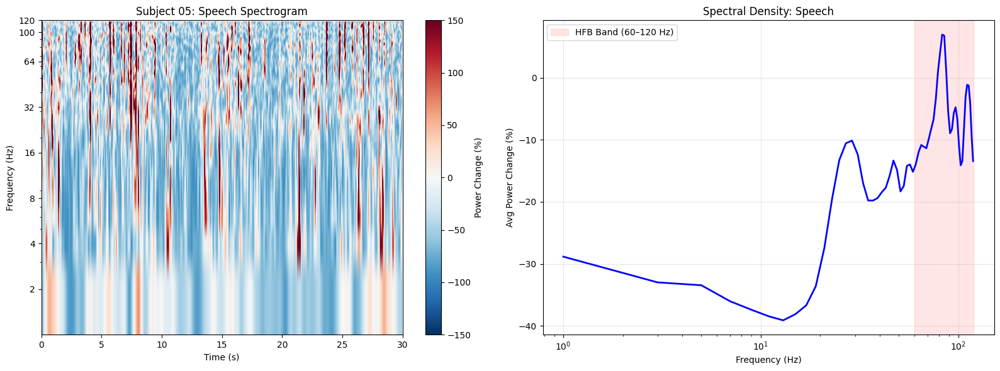

Metrics (Sub-05): T=5.721, p=1.0692e-08, R2=0.0001


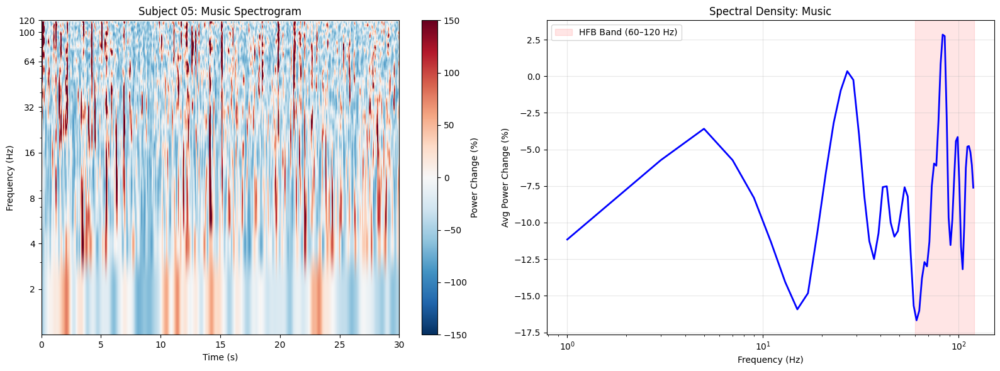

Metrics (Sub-05): T=5.721, p=1.0692e-08, R2=0.0001

Plotting Subject 07...


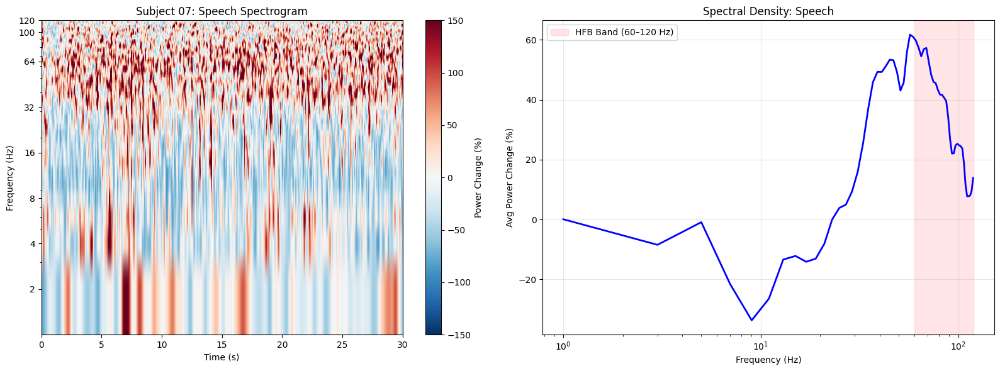

Metrics (Sub-07): T=75.287, p=0.0000e+00, R2=0.1410


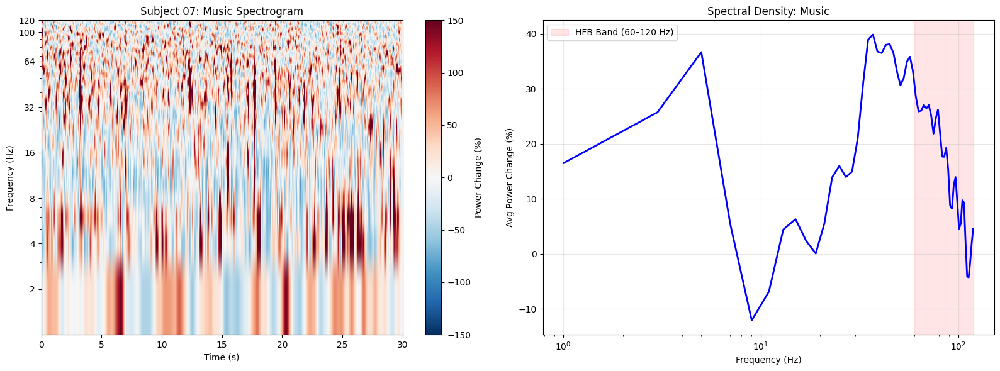

Metrics (Sub-07): T=75.287, p=0.0000e+00, R2=0.1410

Plotting Subject 10...


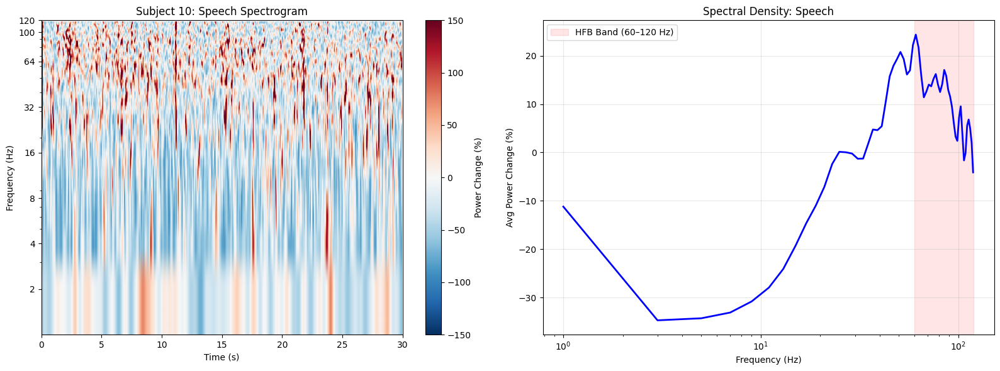

Metrics (Sub-10): T=14.927, p=3.3100e-50, R2=0.0072


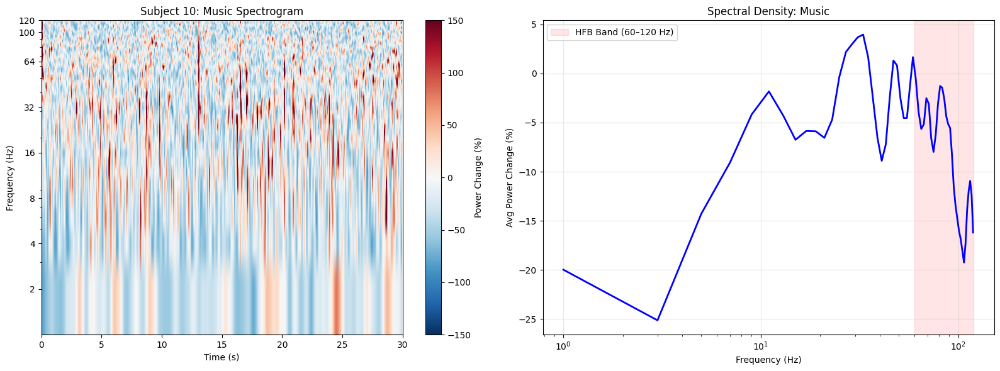

Metrics (Sub-10): T=14.927, p=3.3100e-50, R2=0.0072

Plotting Subject 14...


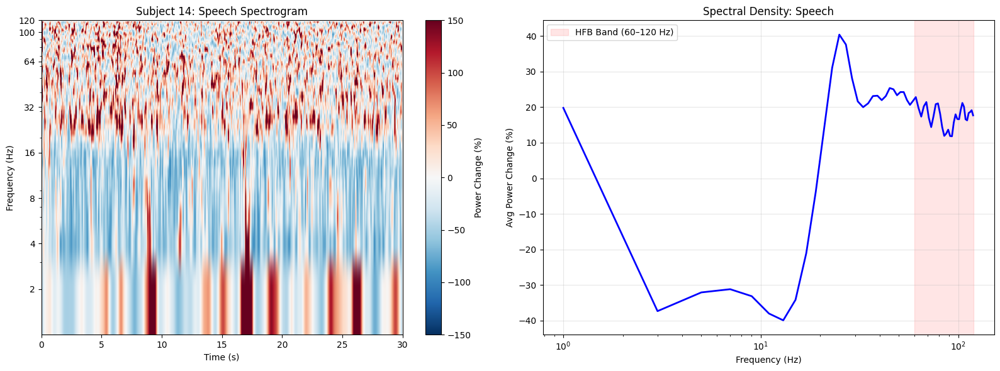

Metrics (Sub-14): T=26.070, p=3.2828e-148, R2=0.0216


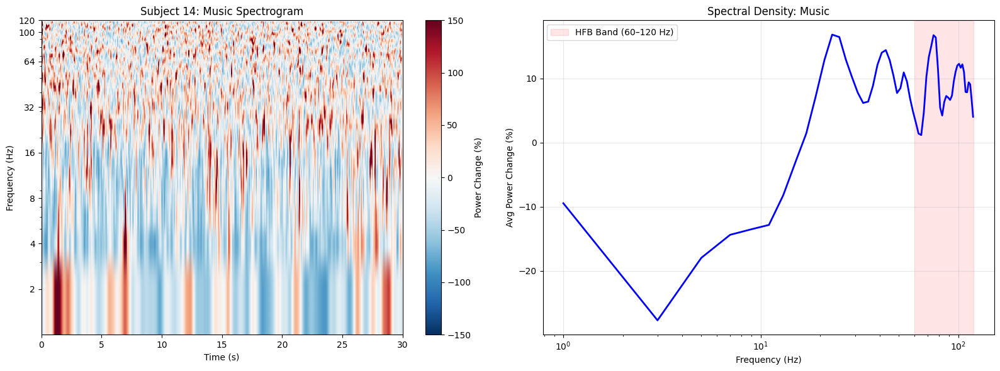

Metrics (Sub-14): T=26.070, p=3.2828e-148, R2=0.0216

Plotting Subject 19...


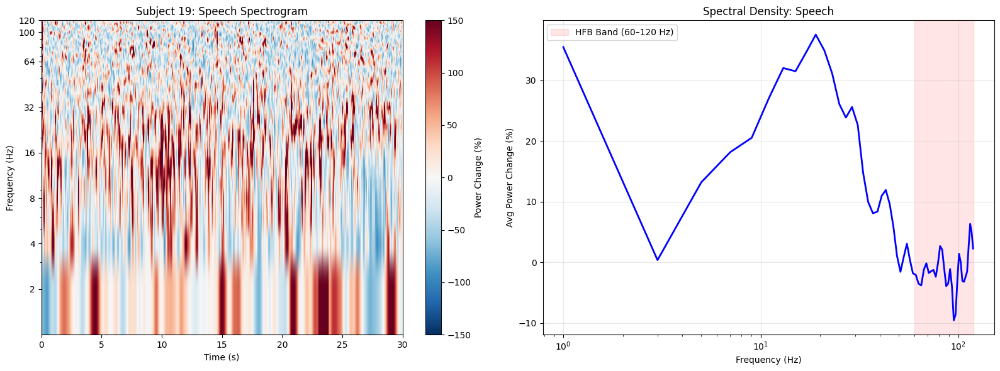

Metrics (Sub-19): T=3.448, p=5.6621e-04, R2=0.0000


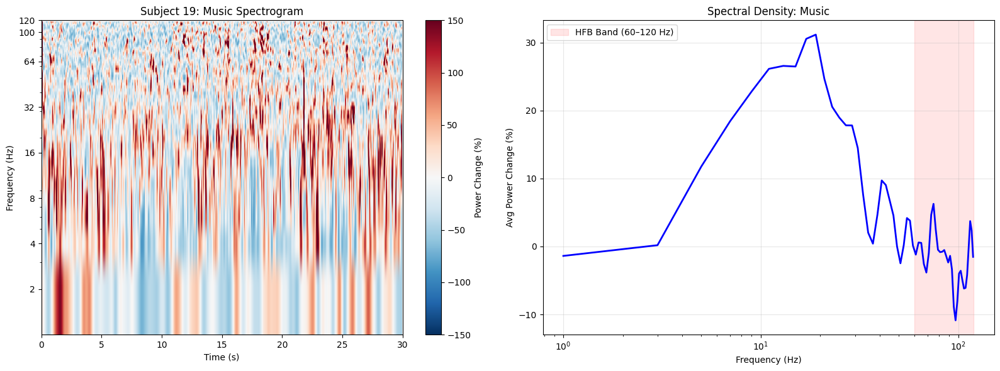

Metrics (Sub-19): T=3.448, p=5.6621e-04, R2=0.0000

Plotting Subject 20...


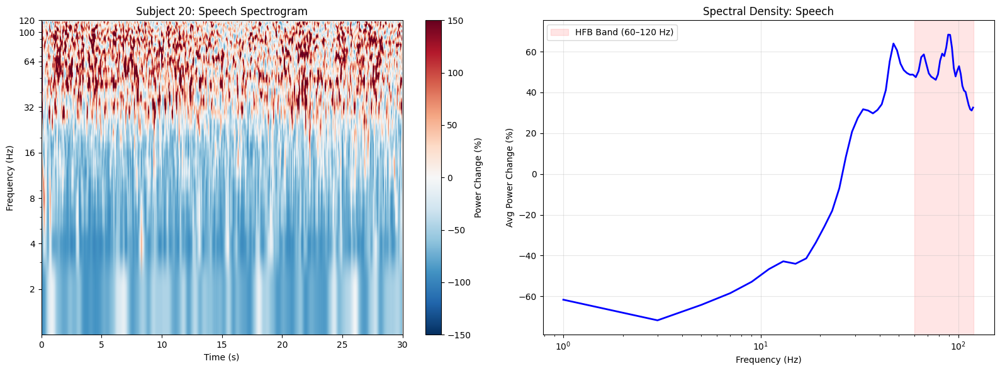

Metrics (Sub-20): T=48.667, p=0.0000e+00, R2=0.0716


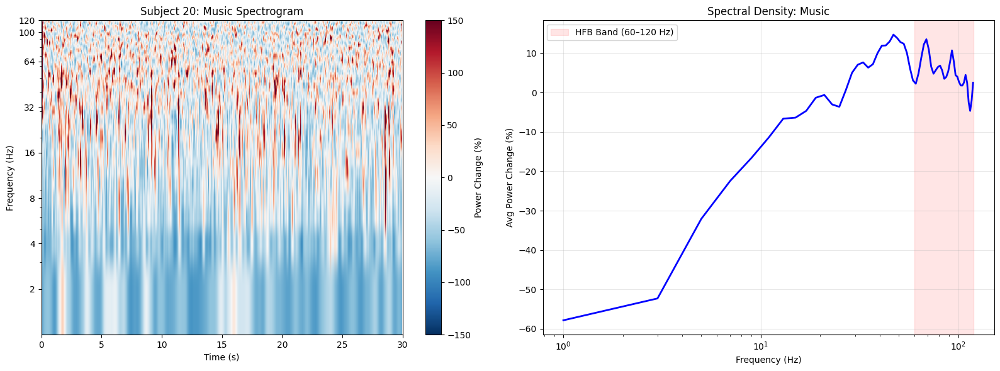

Metrics (Sub-20): T=48.667, p=0.0000e+00, R2=0.0716

Plotting Subject 26...


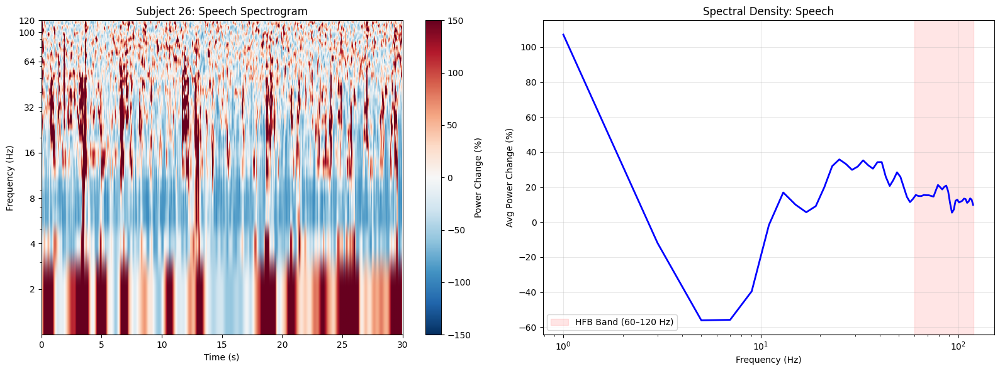

Metrics (Sub-26): T=-10.977, p=5.5473e-28, R2=-0.0039


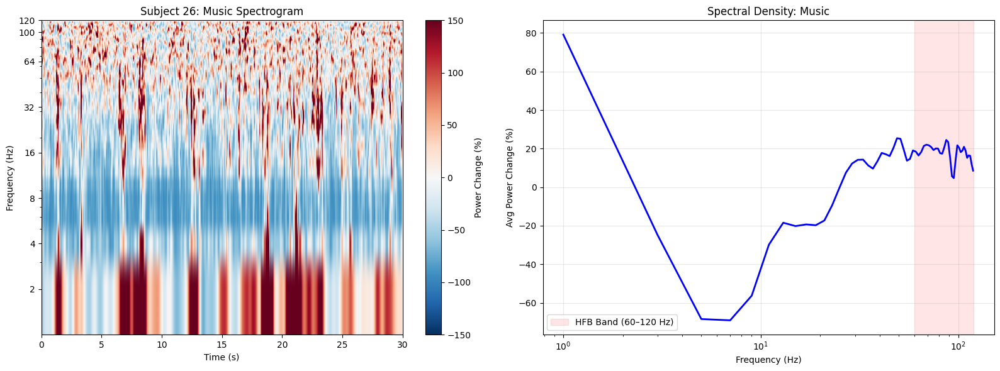

Metrics (Sub-26): T=-10.977, p=5.5473e-28, R2=-0.0039

Plotting Subject 34...


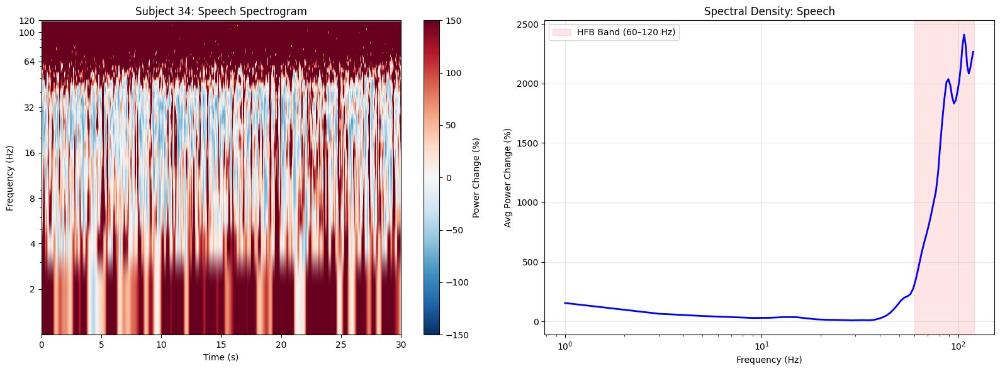

Metrics (Sub-34): T=-58.955, p=0.0000e+00, R2=-0.1093


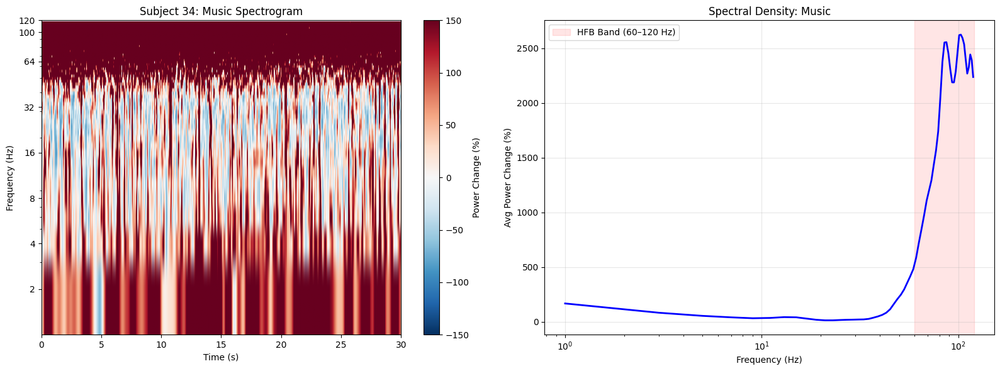

Metrics (Sub-34): T=-58.955, p=0.0000e+00, R2=-0.1093

Plotting Subject 40...


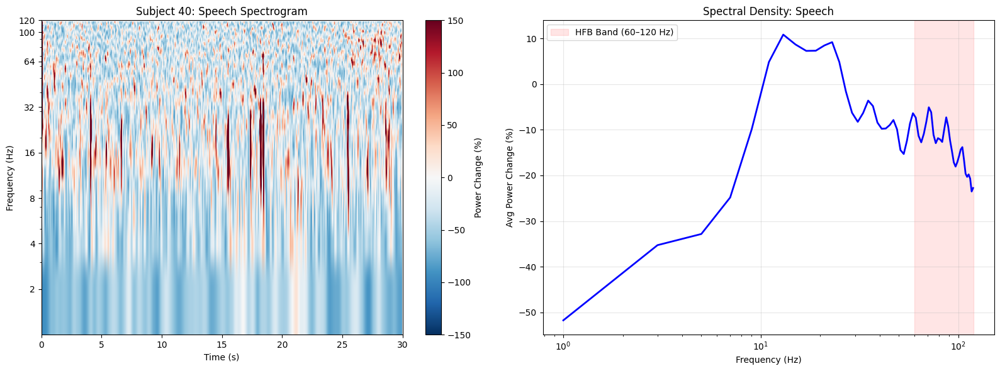

Metrics (Sub-40): T=2.297, p=2.1651e-02, R2=-0.0000


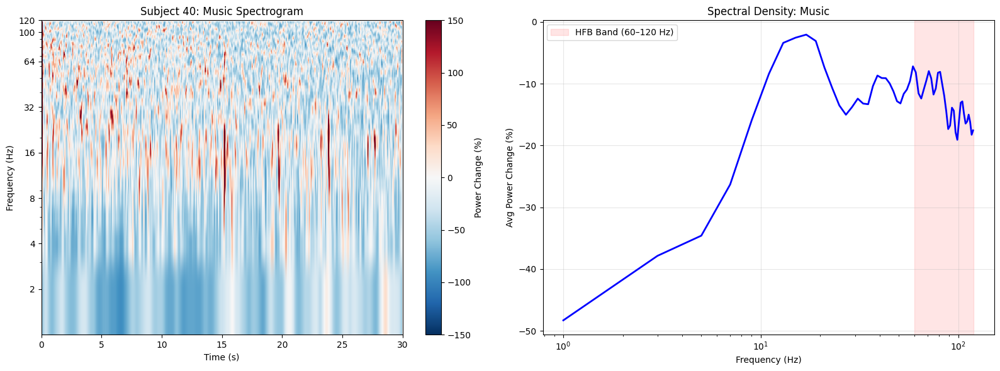

Metrics (Sub-40): T=2.297, p=2.1651e-02, R2=-0.0000

Plotting Subject 46...


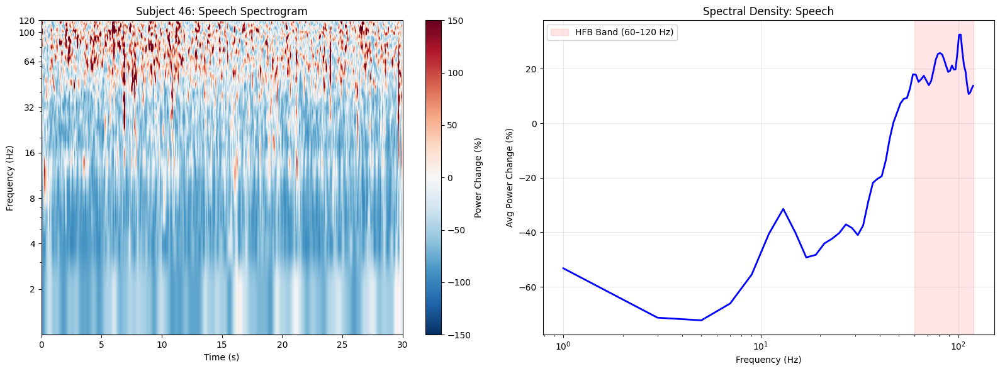

Metrics (Sub-46): T=45.847, p=0.0000e+00, R2=0.0490


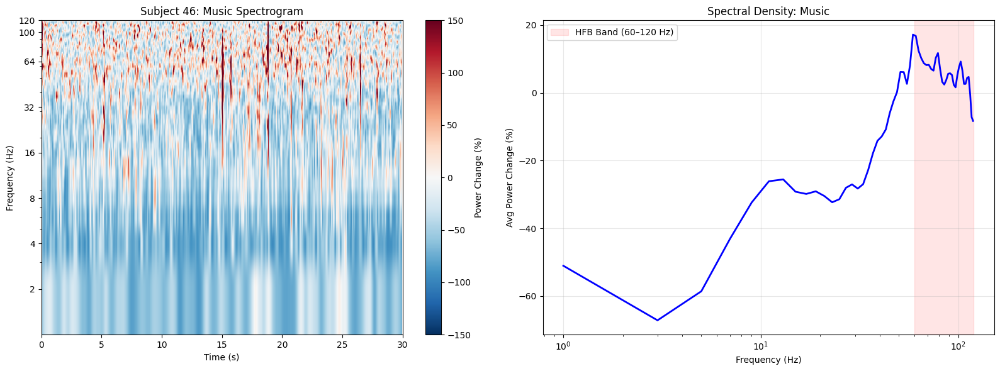

Metrics (Sub-46): T=45.847, p=0.0000e+00, R2=0.0490

GROUP AVERAGE PLOTS

Average Speech Response:


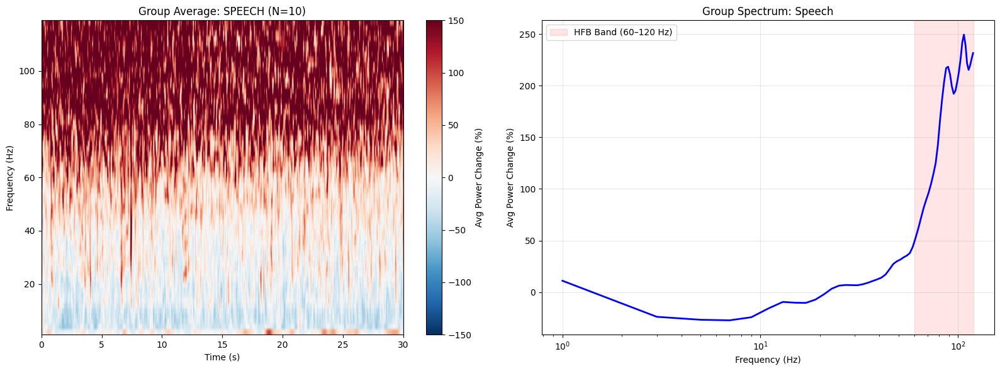


Average Music Response:


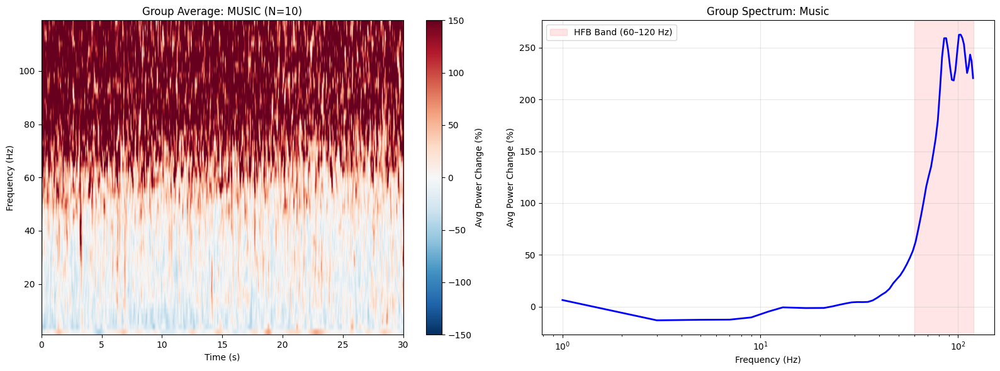


ANALYSIS COMPLETE!


In [15]:
print(f"\n{'='*60}")
print("INDIVIDUAL SUBJECT PLOTS")
print(f"{'='*60}")

for subject in selected_subjects:
    if subject in results:
        print(f"\nPlotting Subject {subject}...")
        plot_individual_tfr(subject, results, condition='speech')
        plot_individual_tfr(subject, results, condition='music')

print(f"\n{'='*60}")
print("GROUP AVERAGE PLOTS")
print(f"{'='*60}")

print("\nAverage Speech Response:")
plot_average_tfr(results, condition='speech')

print("\nAverage Music Response:")
plot_average_tfr(results, condition='music')

print(f"\n{'='*60}")
print("ANALYSIS COMPLETE!")
print(f"{'='*60}")

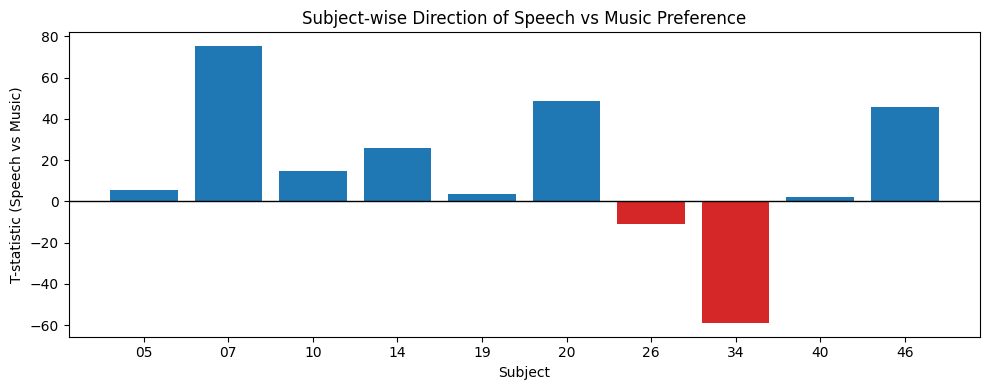

Speech-preferring subjects (T > 0): 8
Music-preferring subjects (T < 0): 2


In [16]:
import matplotlib.pyplot as plt
import numpy as np

subjects = list(results.keys())
t_stats = np.array([results[s]['t_stat'] for s in subjects])

colors = ['tab:blue' if t > 0 else 'tab:red' for t in t_stats]

plt.figure(figsize=(10, 4))
plt.bar(subjects, t_stats, color=colors)
plt.axhline(0, color='black', linewidth=1)

plt.ylabel('T-statistic (Speech vs Music)')
plt.xlabel('Subject')
plt.title('Subject-wise Direction of Speech vs Music Preference')

plt.tight_layout()
plt.show()

# Sign consistency summary
n_pos = np.sum(t_stats > 0)
n_neg = np.sum(t_stats < 0)

print(f"Speech-preferring subjects (T > 0): {n_pos}")
print(f"Music-preferring subjects (T < 0): {n_neg}")